In [152]:
# import related librairies
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, accuracy_score, plot_confusion_matrix

In [2]:
# import dataset
df = pd.read_csv('assets/winequalityN.csv')

In [4]:
df.sample(10)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
2803,white,5.5,0.15,0.32,14.00,0.031,16.0,99.0,0.99437,3.26,0.38,11.5,8
4029,white,6.1,0.28,0.30,7.75,0.031,33.0,139.0,0.99296,3.22,0.46,11.0,6
1746,white,7.5,0.22,0.29,4.80,0.050,33.0,87.0,0.99400,3.14,0.42,9.9,5
3349,white,6.4,0.17,0.27,9.90,0.047,26.0,101.0,0.99596,3.34,0.50,9.9,6
2320,white,8.0,0.20,0.30,8.10,0.037,42.0,130.0,0.99379,3.10,0.67,11.8,6
6408,red,6.4,0.36,0.21,2.20,0.047,26.0,48.0,0.99661,3.47,0.77,9.7,6
4988,red,7.9,0.52,0.26,1.90,0.079,42.0,140.0,0.99640,3.23,0.54,9.5,5
4299,white,6.3,0.28,0.30,6.60,0.208,60.0,154.0,0.99478,3.10,0.40,9.4,6
318,white,5.9,0.30,0.47,7.85,0.030,19.0,133.0,0.99330,3.52,0.43,11.5,7
517,white,7.4,0.15,0.42,1.70,0.045,49.0,154.0,0.99200,3.00,0.60,10.4,6


In [7]:
df.shape

(6497, 13)

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,6487.0,7.216579,1.296750,3.80000,6.40000,7.00000,7.70000,15.90000
volatile acidity,6489.0,0.339691,0.164649,0.08000,0.23000,0.29000,0.40000,1.58000
citric acid,6494.0,0.318722,0.145265,0.00000,0.25000,0.31000,0.39000,1.66000
residual sugar,6495.0,5.444326,4.758125,0.60000,1.80000,3.00000,8.10000,65.80000
chlorides,6495.0,0.056042,0.035036,0.00900,0.03800,0.04700,0.06500,0.61100
free sulfur dioxide,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
total sulfur dioxide,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
density,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
pH,6488.0,3.218395,0.160748,2.72000,3.11000,3.21000,3.32000,4.01000
sulphates,6493.0,0.531215,0.148814,0.22000,0.43000,0.51000,0.60000,2.00000


In [5]:
df.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
df.shape

(5329, 13)

In [12]:
df.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [13]:
df.dropna(inplace=True)

In [14]:
df.isna().sum()

type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [15]:
df.shape

(5295, 13)

<AxesSubplot:>

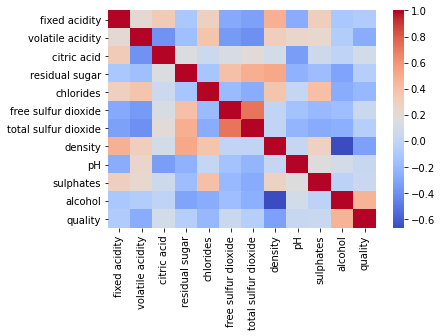

In [16]:
# heatmap to have the correlation
sns.heatmap(df.corr(), cmap="coolwarm")

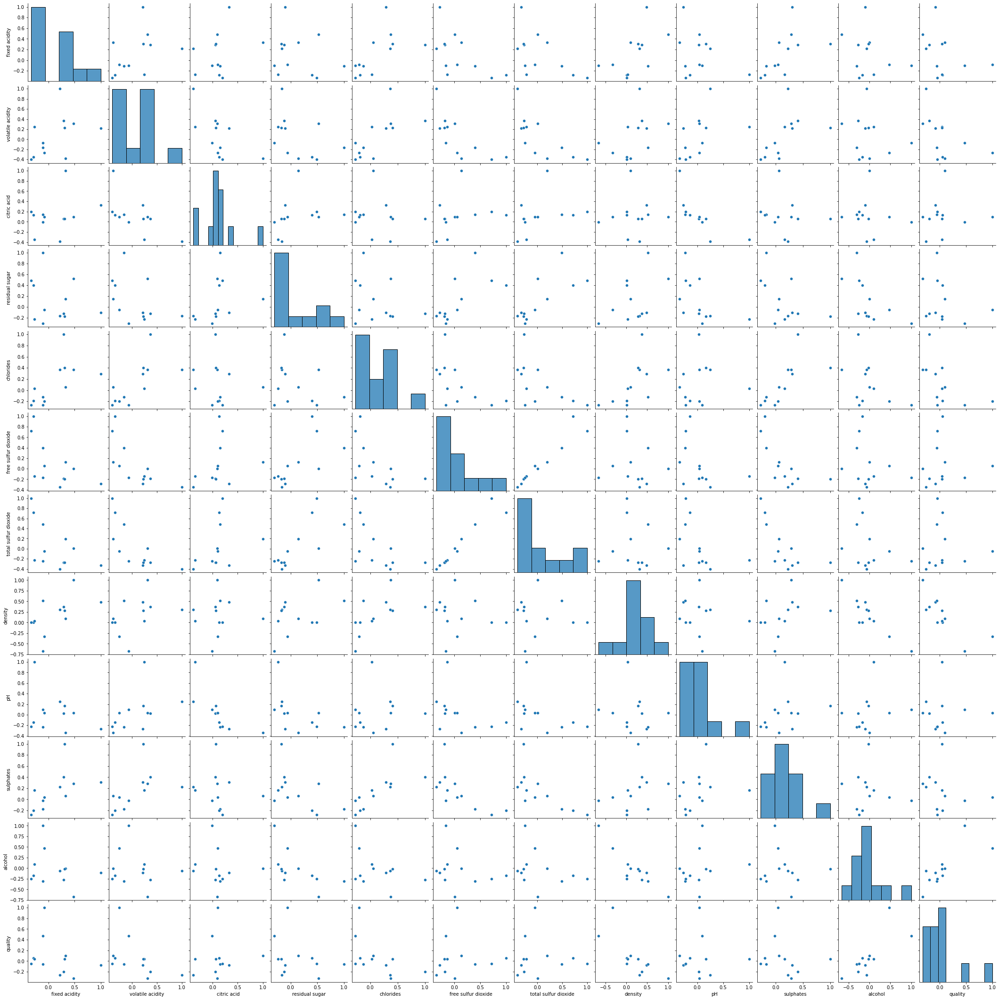

In [60]:
# plot relation betwween columns
sns.pairplot(df.corr())

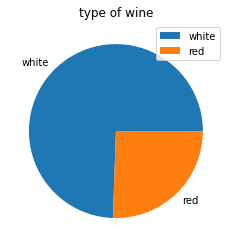

In [22]:
# plot types
plt.figure(figsize=(10,8))
plt.pie(df["type"].value_counts(), labels=["white", "red"])
plt.title("type of wine")
plt.legend()
plt.show()

Here we can see that the amount of data avalable for the two types is not equal. This can lead to a biais prediction since the amount of red wine is very low compared to the white ones.

<AxesSubplot:xlabel='quality', ylabel='Count'>

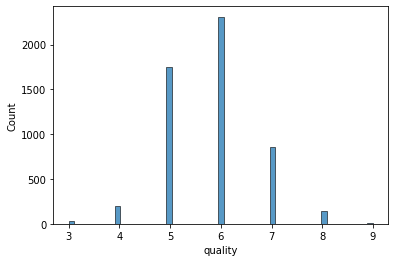

In [26]:
plt.figure(figsize=(10,8))
sns.histplot(df['quality'])

We notice that wine qualite 5, 6 and 7 (middle) are the most sold. Quality 3, 4 and 8, 9 are rare and this can be understood with this hypothesis: bad quality is hard to sell and useless and High quality are expensive and cost a lot.

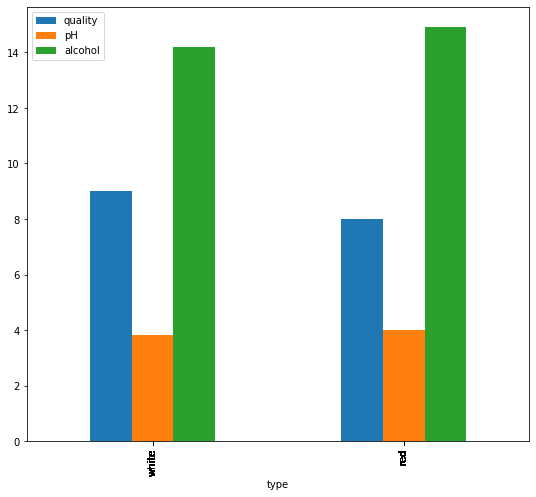

In [55]:
#
df.plot(x="type", y=["quality", "pH", "alcohol"], kind="bar",figsize=(9,8))
plt.show()

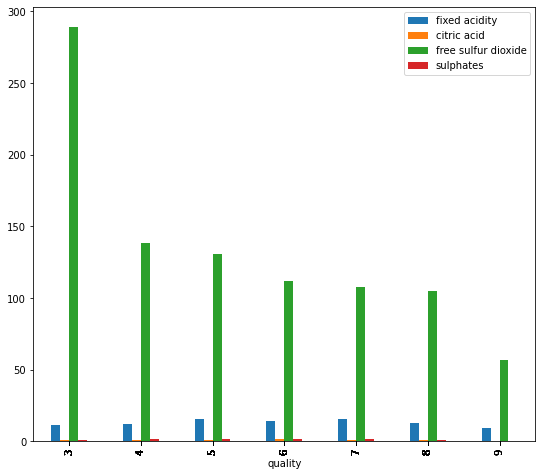

In [59]:
df.plot(x="quality", y=["fixed acidity", "citric acid", "free sulfur dioxide", "sulphates"], kind="bar",figsize=(9,8))
plt.show()

In [74]:
'''
 changing values of quality column
    - from 1 to 4 : bad quality = 0
    - from 5 to 7 : good quality = 1
    - from 8 to 10 : high quality = 2

'''
def quality(quality):
    list0 = [0, 1, 2, 3, 4]
    list1 = [5, 6, 7]
    list2 = [8, 9, 10]

    df[quality].replace(list0, 0, inplace=True)
    df[quality].replace(list1, 1, inplace=True)
    df[quality].replace(list2, 2, inplace=True)

    return df[quality]

In [75]:
quality('quality')

0       1
1       1
2       1
3       1
6       1
       ..
6490    1
6491    1
6492    1
6495    1
6496    1
Name: quality, Length: 5295, dtype: int64

In [76]:
df['quality'].unique()

array([1, 2, 0])

In [77]:
df['quality'].value_counts()

1    4908
0     234
2     153
Name: quality, dtype: int64

In [78]:
# replace white and red by int 
# white = 1
# red = 0

df['type'].replace("white", 1, inplace=True)
df['type'].replace("red", 0, inplace=True)

df['type'].value_counts()

1    3942
0    1353
Name: type, dtype: int64

In [87]:
df.sample(10)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
723,1,6.6,0.330,0.31,1.3,0.020,29.0,89.0,0.99035,3.26,0.44,12.4,2
4687,1,6.7,0.160,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,1
3965,1,7.3,0.380,0.23,6.5,0.050,18.0,102.0,0.99304,3.10,0.55,11.2,0
4555,1,6.8,0.450,0.30,11.8,0.094,23.0,97.0,0.99700,3.09,0.44,9.6,1
2499,1,6.9,0.260,0.31,7.0,0.039,37.0,175.0,0.99376,3.32,0.49,11.4,1
4047,1,6.9,0.190,0.35,13.5,0.038,49.0,118.0,0.99546,3.00,0.63,10.7,1
860,1,8.1,0.270,0.35,1.7,0.030,38.0,103.0,0.99255,3.22,0.63,10.4,2
3057,1,7.2,0.270,0.37,5.4,0.026,27.0,114.0,0.99174,3.13,0.84,12.7,1
4787,1,3.9,0.225,0.40,4.2,0.030,29.0,118.0,0.98900,3.57,0.36,12.8,2
3951,1,6.3,0.330,0.20,17.9,0.066,36.0,161.0,0.99910,3.14,0.51,8.8,1


In [89]:
# splitting dataset target and features
y = df['quality']
X = df.drop('quality', axis=1)

In [90]:
print(f'X shape={X.shape}')
print(f'y shape= {y.shape}')

X shape=(5295, 12)
y shape= (5295,)


In [93]:
# train test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, shuffle=True)

In [94]:
print(f'X train shape={X_train.shape}')
print(f'y train shape={y_train.shape}')
print(f'X test shape={X_test.shape}')
print(f'y test shape={y_test.shape}')

X train shape=(4236, 12)
y train shape=(4236,)
X test shape=(1059, 12)
y test shape=(1059,)


In [96]:
# instanciate scaler
mms = MinMaxScaler()

# X train and X test transfomatio

X_train = mms.fit_transform(X_train)
X_test = mms.transform(X_test)

In [98]:
# apply classifier
knn = KNeighborsClassifier()

knn.fit(X_train, y_train)
print(f'Train Score = {knn.score(X_train, y_train):.3f}')
print(f'Test Score = {knn.score(X_test, y_test):.3f}')

Train Score = 0.931
Test Score = 0.922


In [100]:
# prediction
y_pred = knn.predict(X_test)

# accuracy score
print(f'Accuray Score= {accuracy_score(y_test, y_pred):.3f}')

Accuray Score= 0.922


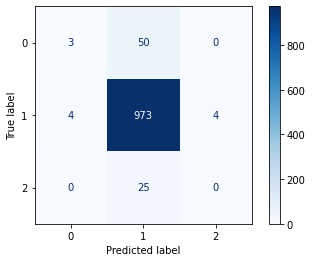

In [110]:
# confusion matrics
#confusion_matrix(y_test, y_pred)
plot_confusion_matrix(knn, X_test, y_test, cmap=plt.cm.Blues)

In [117]:
print(f'Cross val Score = {cross_val_score(knn, X_train, y_train).mean():.3f}')

Cross val Score = 0.925


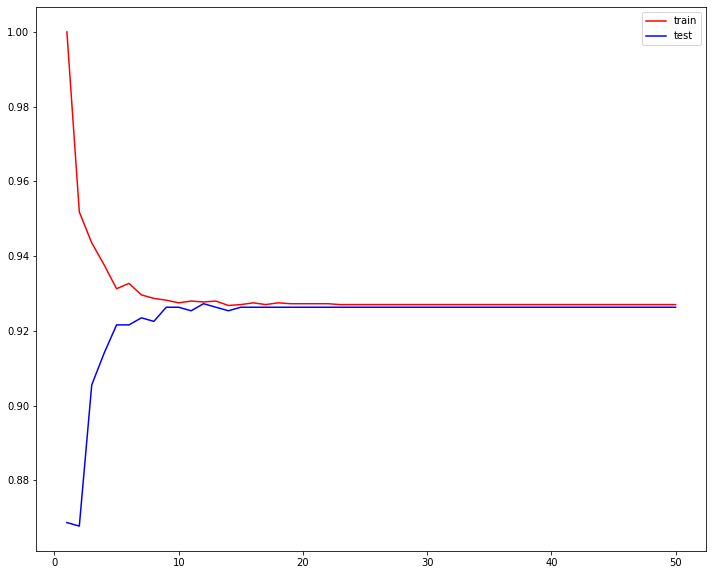

In [129]:
train_score = []
test_score = []
k = np.arange(1, 51)
for i in k:
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    tr_score = knn.score(X_train, y_train)
    te_score = knn.score(X_test, y_test)
    train_score.append(tr_score)
    test_score.append(te_score)

# plot results
plt.figure(figsize=(12, 10))
plt.plot(k, train_score, c='red', label='train')
plt.plot(k, test_score, c='blue', label='test')
plt.legend()

In [130]:
# maximum test score
print(f'Max Test Score = {max(test_score):.3f}')

Max Test Score = 0.927


In [132]:
k = np.arange(10, 15)
for i in k:
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    print(f'For k = {i}, Test score = {knn.score(X_train, y_train):.3f}, Train score = {knn.score(X_test, y_test):.3f}')

For k = 10, Test score = 0.928, Train score = 0.926
For k = 11, Test score = 0.928, Train score = 0.925
For k = 12, Test score = 0.928, Train score = 0.927
For k = 13, Test score = 0.928, Train score = 0.926
For k = 14, Test score = 0.927, Train score = 0.925


## we have the best score when : k = 12, Test score = 0.928, Train score = 0.927

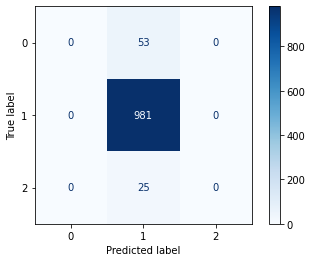

In [135]:
# confusion matrics
#confusion_matrix(y_test, y_pred)
plot_confusion_matrix(knn, X_test, y_test, cmap=plt.cm.Blues)

we see that for the low quality wine, we have bad prediction du to a biais dataset as data amount is not equally distributed.

In [136]:
# apply classifier
knn = KNeighborsClassifier(n_neighbors=12)

knn.fit(X_train, y_train)
print(f'Train Score = {knn.score(X_train, y_train):.3f}')
print(f'Test Score = {knn.score(X_test, y_test):.3f}')

Train Score = 0.928
Test Score = 0.927


In [168]:
# apply classifier
knn = KNeighborsClassifier()

knn.fit(X_train, y_train)
print(f'Train Score = {knn.score(X_train, y_train):.3f}')
print(f'Test Score = {knn.score(X_test, y_test):.3f}')
# prediction
y_pred = knn.predict(X_test)

# accuracy score
print(f'Accuray Score= {accuracy_score(y_test, y_pred):.3f}')
print(f'Cross val Score = {cross_val_score(knn, X_train, y_train).mean():.3f}')

Train Score = 0.931
Test Score = 0.922
Accuray Score= 0.922
Cross val Score = 0.925


In [148]:
# roc curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
print(f'False Positive= {fpr} \n True Positive= {tpr} \n Tresholds= {thresholds} \n')


False Positive= [0.         0.         0.96153846 1.        ] 
 True Positive= [0.         0.00407747 0.99592253 1.        ] 
 Tresholds= [3 2 1 0] 



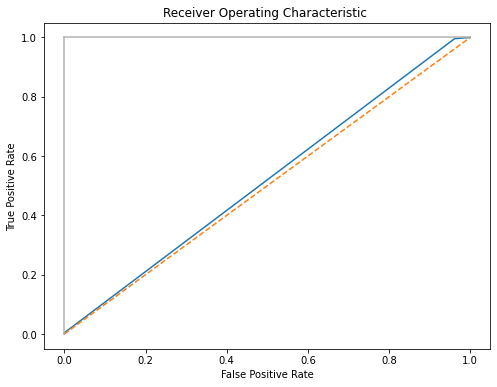

In [150]:
# Ploting ROC curves
plt.figure(figsize=(8,6))
plt.title('Receiver Operating Characteristic ')
plt.plot(fpr, tpr)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
#plt.savefig("img/" + str(classif) + ".png")
plt.show()